# 1. Bussiness Understning

In this notebook, I will try to explore and analyze dataset collected across the world in order to provide answers to the following questions:
##### 1. Which countries have the highest total cases/deaths toll?
##### 2. Is the number of COVID-19 cases correlated with country population?
##### 3. What is the case fatality rate?

# 2. Data Understanidng 

### Libraries 

We first instrall the libraries we need for this project

In [1]:
import pandas as pd #To retrieve and deal with data we import
#Data visualazation
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

### 2.1 Gather Data

The dataset we are using in this project can be accssed through [Mendeley](https://data.mendeley.com/datasets/b2wvnbnpj9/1) website. 

### 2.2  Retrieve and read in the data 

In the cell below, we read the data we downloaded as csv file in 'data' variable as a pandas dataframe

In [2]:
#read the data
data = pd.read_csv('Desktop/Udacity/raw_data.csv')

### 2.3 Data Assessment

In [6]:
data = data.sample(frac = 1) #shuffle the data
data.head(10) #Display 10 rows from data

,iso_code,location,date,total_cases,total_deaths,stringency_index,population,gdp_per_capita,human_development_index,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
45243,TJK,Tajikistan,2020-09-26,9562.0,74.0,33.33,9537642,2896.913,0.650,9.165552189,4.304065093,3.506457892,16.070757,7.971400966
42155,ZAF,South Africa,2020-06-23,101590.0,1991.0,76.85,59308690,12294.876,0.699,11.52870038,7.596392304,4.34185547,17.898266,9.416937869
42206,ZAF,South Africa,2020-08-13,568919.0,11010.0,80.56,59308690,12294.876,0.699,13.25149335,9.30655923,4.389002248,17.898266,9.416937869
21449,IND,India,2020-01-21,NaN,NaN,0.00,1380004385,6426.674,0.640,#NUM!,#NUM!,#NUM!,21.045353,8.768212421
17948,GHA,Ghana,2020-03-16,2.0,NaN,44.44,31072945,4227.630,0.592,0.693147181,#NUM!,3.794139965,17.251848,8.349396831
21587,IND,India,2020-06-07,246628.0,6929.0,75.46,1380004385,6426.674,0.640,12.41563641,8.843470782,4.323602715,21.045353,8.768212421
24755,KAZ,Kazakhstan,2020-06-21,17225.0,118.0,80.09,18776707,24055.588,0.800,9.754117096,4.770684624,4.383151002,16.748128,10.0881226
42826,ESP,Spain,2020-03-01,82.0,NaN,11.11,46754783,34272.360,0.891,4.406719247,#NUM!,2.407845604,17.660427,10.44209448
9246,CAF,Central African Republic,2020-05-21,411.0,NaN,75.93,4829764,661.240,0.367,6.018593214,#NUM!,4.329811863,15.390308,6.49411686
44284,SWE,Sweden,2020-10-05,95799.0,5895.0,37.04,10099270,46949.283,0.933,11.47000753,8.681859813,3.61199841,16.127974,10.75682321




This dataset is mainly collected for the purpose of studying/analyzing how COVID-19 impcated the economy in 170 countries across the world. However, it also has the information we need to answer our questions such as location, total_cases and total_deasths.

In [9]:
print("This dataset has",data.shape[0],"rows and",data.shape[1],"columns")

This dataset has 50418 rows and 14 columns


In [10]:
#Provide the set of features we have 
data.columns

Index(['iso_code', 'location', 'date', 'total_cases', 'total_deaths',
       'stringency_index', 'population', 'gdp_per_capita',
       'human_development_index', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11',
       'Unnamed: 12', 'Unnamed: 13'],
      dtype='object')

# 3. Data Preparation

## 2.1 Data Cleaning

#### Missing Values

In [11]:
#Provide a set of columns with more than 75% of the values missing
most_missing_cols = set(data.columns[data.isnull().mean() > 0.75])

most_missing_cols

set()

We do not have any column that have missing values more than 75%

In [12]:
no_missing_cols = set(data.columns[data.isnull().mean() == 0])#Provide a set of columns with zero values missing

no_missing_cols

{'Unnamed: 10',
 'Unnamed: 11',
 'Unnamed: 12',
 'Unnamed: 13',
 'Unnamed: 9',
 'date',
 'iso_code',
 'location',
 'population'}

The cell above shows us the columns with no missing values. However, for our purpose, we will remove the unnamed columns and iso_code as 'location' and 'iso_code' provide the same information.
Also, we will creat another dataframe that contain only the columns we are intrested in for the purpose of answering questions and data visualation as this step does not require to include all the columns/features

In [3]:
#This is another way to check the null values in each columns, it displays how many missing values each column has
print(data.isnull().sum())

iso_code                       0
location                       0
date                           0
total_cases                 3094
total_deaths               11190
stringency_index            7126
population                     0
gdp_per_capita              5712
human_development_index     6202
Unnamed: 9                     0
Unnamed: 10                    0
Unnamed: 11                    0
Unnamed: 12                    0
Unnamed: 13                    0
dtype: int64


In [3]:
#Drop Unamed columns and ISO code (axis = 1) 
data.drop(['iso_code', "Unnamed: 9", 'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13'], axis=1, inplace=True)

We could notice from reviewing (by using pandas head method or openign the csv file) the data that some locations do not have information such as Hong Kong, therefore, we will first remove these rows.

In [4]:
#Check and confirm that Hong Kong has missig values regarding the information we need, in this case (total_cases and total_deaths)
HongKong = data.loc[data['location'] == 'Hong Kong'] 
HongKong

,location,date,total_cases,total_deaths,stringency_index,population,gdp_per_capita,human_development_index
20853,Hong Kong,2020-01-31,NaN,NaN,49.07,7496988,56054.92,0.933
20854,Hong Kong,2020-02-29,NaN,NaN,52.78,7496988,56054.92,0.933
20855,Hong Kong,2020-03-31,NaN,NaN,63.89,7496988,56054.92,0.933
20856,Hong Kong,2020-04-30,NaN,NaN,66.67,7496988,56054.92,0.933
20857,Hong Kong,2020-05-31,NaN,NaN,52.78,7496988,56054.92,0.933
20858,Hong Kong,2020-06-30,NaN,NaN,41.67,7496988,56054.92,0.933
20859,Hong Kong,2020-07-31,NaN,NaN,66.67,7496988,56054.92,0.933
20860,Hong Kong,2020-08-31,NaN,NaN,66.67,7496988,56054.92,0.933
20861,Hong Kong,2020-09-01,NaN,NaN,66.67,7496988,56054.92,0.933
20862,Hong Kong,2020-09-02,NaN,NaN,66.67,7496988,56054.92,0.933


In [6]:
#Drop HongKong rows 
data.drop(data[data['location'] == 'Hong Kong'].index, inplace = True)

In [16]:
#check the type of each column/feature
data.dtypes

location                    object
date                        object
total_cases                float64
total_deaths               float64
stringency_index           float64
population                   int64
gdp_per_capita             float64
human_development_index    float64
dtype: object

Impute the missing values in data using lambda function and apply method. we have missing values only in numerical columns and thus we are using the mean function 

In [5]:
data['location']
# Mean function for numerical columns
fill_mean = lambda col: col.fillna(col.mean())
# Fill the mean
data[['total_cases', 'total_deaths', 'stringency_index', 'population', 'gdp_per_capita', 'human_development_index']].apply(fill_mean, axis=0)


,total_cases,total_deaths,stringency_index,population,gdp_per_capita,human_development_index
0,0.0,0.0,0.00,38928341,1803.987,0.498
1,0.0,0.0,0.00,38928341,1803.987,0.498
2,0.0,0.0,0.00,38928341,1803.987,0.498
3,0.0,0.0,0.00,38928341,1803.987,0.498
4,0.0,0.0,0.00,38928341,1803.987,0.498
...,...,...,...,...,...,...
50413,8055.0,231.0,76.85,14862927,1899.775,0.535
50414,8075.0,231.0,76.85,14862927,1899.775,0.535
50415,8099.0,231.0,76.85,14862927,1899.775,0.535
50416,8110.0,231.0,76.85,14862927,1899.775,0.535


### 2.2 Add Columns

In this project, we are intrested in finding the Case Fatality Rate (CFR) for each country. CFR is the rate of death according the cases.
We do not have the column that provide the CFR in this dataset but, we have enough information to easily calcualte it for each country.

In the next cell, before adding the column we need, we are creating a new dataframe that only contain the information (cases and deaths toll) for each country until a specific date. Here we are intrested to know the CFR until the last day this data was collected for each country.
Therefore, we are sorting the dataframe per date and getting the last row of each country (location) using tail method.

In [28]:
#Save a dataframe that holds the last number of cases and deaths for each country and put it in total variable 
total = data.sort_values('date').groupby('location').tail(1)
#Save the new dataframe (total) on local machine
total.to_csv('Desktop/Udacity/total.csv')

##### Case Fatality Rate formula
CFR = Deaths / cases

In [29]:
#calculate the deaths percentage of each country/row in total dataframe and add the column, here we name our new colum as death_rate
total.loc[: ,'death_rate'] = total.loc[ :,'total_deaths'] * 100 / total.loc[: ,'total_cases']


# 4. Data visualization

##### 1. Which countries have the highest total cases/deaths toll?

<AxesSubplot:xlabel='total_deaths', ylabel='location'>

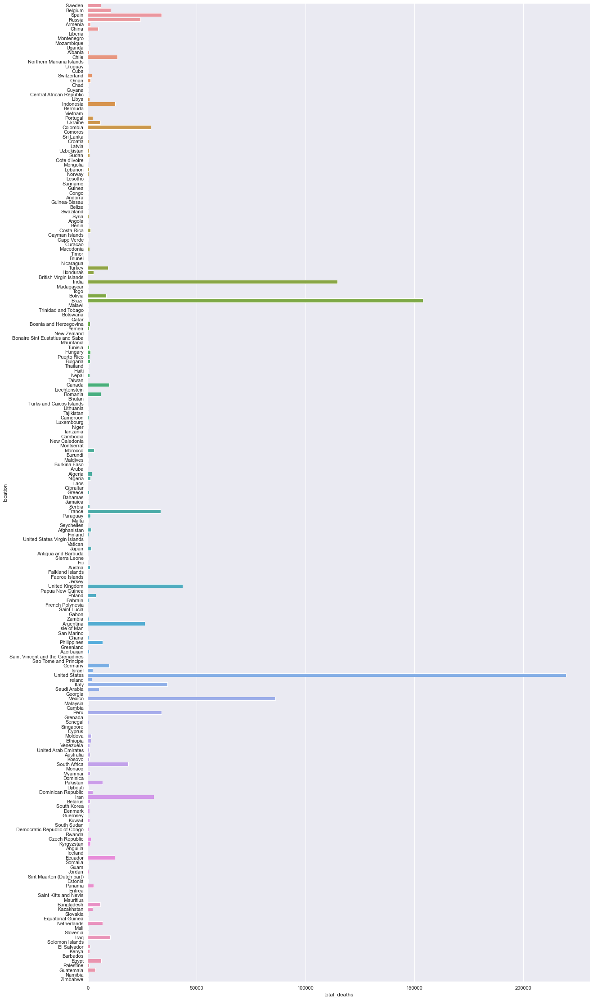

In [30]:
sns.set(rc={'figure.figsize':(20,40)})
sns.barplot(x='total_deaths', y='location', data=total)

##### Number of deaths in each country by October 2020

In [31]:
fig = px.scatter(total, x='location', y='total_deaths', color='location',  hover_data=['total_deaths', "location"])
fig.show()

In [32]:
fig = px.scatter(total, x='location', y='total_cases', color='location',  hover_data=['total_cases', "location"])
fig.show()

##### 2. Is the number of COVID-19 cases correlated with country population?

<AxesSubplot:>

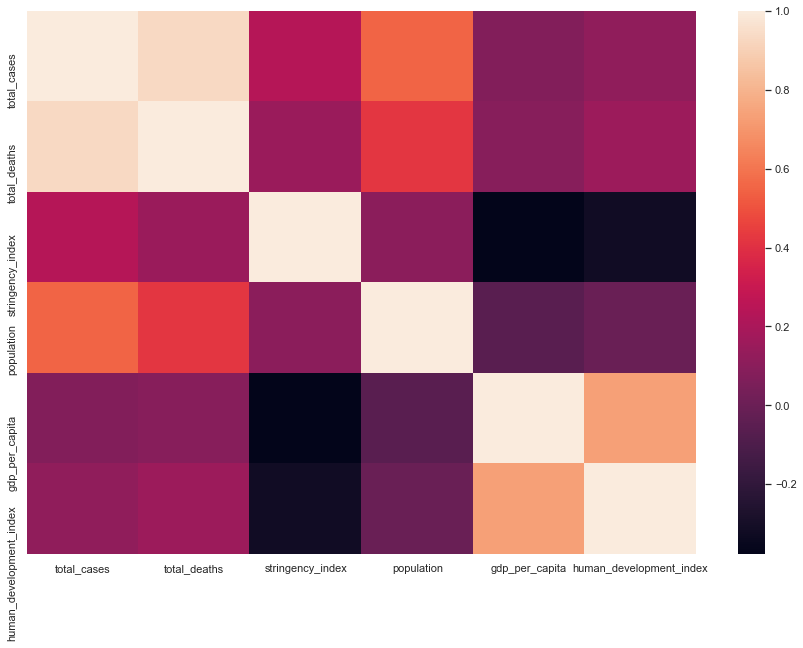

In [112]:
plt.subplots(figsize=(15,10))

sns.heatmap(total.corr())

In [16]:

fig = px.scatter(data, x="date", y="total_cases",color="location",width=1200, height=900,
                 title="COVID-19 cases total by country",
                 hover_data=['date', "location"])
fig.show()


##### 3. What is the case fatality rate for each country?

In [34]:
fig = px.bar(x=total['location'], y=total['death_rate'], color=total['location'],
             labels=dict(x="Country", y="CFR", color="Country"))
fig.show()